In [15]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from IPython.display import display, Image
from ultralytics import YOLO
from tqdm import tqdm 
import yaml

In [16]:
class Config:
    DATASET_DIR = "dataset"
    ANNOT_FILE = "_annotations.csv"
    MODEL_NAME = "yolov8m.pt"
    IMG_SIZE = 1280
    EPOCHS = 200
    BATCH = 16
    DEVICE = 'cuda:3'
    TEST_SIZE = 0.2
    RUN_NAME = "train"
    PATIENCE = 50

    AUGMENTATIONS = {
        'hsv_h': 0.015,
        'hsv_s': 0.7,
        'hsv_v': 0.5,
        'translate': 0.1,
        'scale': 0.7,
        'fliplr': 0.5,
        'mosaic': 1.0,
        'mixup': 0.2
    }

In [17]:
def prepare_data():
    os.makedirs("yolo_dataset/images/train", exist_ok=True)
    os.makedirs("yolo_dataset/images/val", exist_ok=True)
    os.makedirs("yolo_dataset/images/test", exist_ok=True)
    os.makedirs("yolo_dataset/labels/train", exist_ok=True)
    os.makedirs("yolo_dataset/labels/val", exist_ok=True)
    os.makedirs("yolo_dataset/labels/test", exist_ok=True)

    df = pd.read_csv(Config.ANNOT_FILE)

    train_files, temp_files = train_test_split(
        df["filename"].unique(),
        test_size=Config.TEST_SIZE * 2,
        random_state=42
    )
    val_files, test_files = train_test_split(
        temp_files,
        test_size=0.5,
        random_state=42
    )

    def convert_to_yolo(row):
        x_center = (row["xmin"] + row["xmax"]) / 2 / row["width"]
        y_center = (row["ymin"] + row["ymax"]) / 2 / row["height"]
        width = (row["xmax"] - row["xmin"]) / row["width"]
        height = (row["ymax"] - row["ymin"]) / row["height"]
        return f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"

    for split, files in [("train", train_files), ("val", val_files), ("test", test_files)]:
        for file in files:
            img_path = os.path.join(Config.DATASET_DIR, file)
            if os.path.exists(img_path):
                img = cv2.imread(img_path)
                cv2.imwrite(f"yolo_dataset/images/{split}/{file}", img)

                with open(f"yolo_dataset/labels/{split}/{file.replace('.jpg', '.txt')}", "w") as f:
                    for _, row in df[df["filename"] == file].iterrows():
                        f.write(convert_to_yolo(row) + "\n")

    yaml_content = {
        'path': os.path.abspath("yolo_dataset"),
        'train': 'images/train',
        'val': 'images/val',
        'test': 'images/test',
        'names': {0: 'human'},
    }

    with open("yolo_dataset/dataset.yaml", "w") as f:
        yaml.dump(yaml_content, f)

    print(f"Данные подготовлены. Распределение:")
    print(f"- Train: {len(train_files)} изображений")
    print(f"- Val: {len(val_files)} изображений")
    print(f"- Test: {len(test_files)} изображений")

In [18]:
def train_model():
    model = YOLO(Config.MODEL_NAME)

    results = model.train(
        data="yolo_dataset/dataset.yaml",
        epochs=Config.EPOCHS,
        imgsz=Config.IMG_SIZE,
        rect=True,
        batch=Config.BATCH,
        device=Config.DEVICE,
        workers=16,
        name=Config.RUN_NAME,
        exist_ok=True,
        patience=Config.PATIENCE,
        augment=True,
        plots=True,
        verbose=True,
        single_cls=True,
        close_mosaic=10,
        cos_lr=True,
        **Config.AUGMENTATIONS
    )
    return model

In [26]:
def evaluate_model(model):
    print("\nРезультаты валидации:")
    val_metrics = model.val(split='val')
    print(f"mAP50: {val_metrics.box.map50:.4f}")
    print(f"mAP50-95: {val_metrics.box.map:.4f}")

    print("\nРезультаты тестирования:")
    test_metrics = model.val(split='test')
    print(f"Test mAP50: {test_metrics.box.map50:.4f}")
    print(f"Test mAP50-95: {test_metrics.box.map:.4f}")

In [21]:
prepare_data()

Данные подготовлены. Распределение:
- Train: 591 изображений
- Val: 197 изображений
- Test: 197 изображений


In [22]:
model = train_model()

Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.6.0+cu124 CUDA:3 (Tesla V100-SXM2-32GB, 32494MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=yolo_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=3, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.5, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspective=0.0, plots=True, pose=12.0, pretra

train: Scanning /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/train... 591 images, 0 backgrounds, 0 corrupt: 100%|██████████| 591/591 [00:00<00:00, 905.14it/s]

train: New cache created: /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ 'rect=True' is incompatible with DataLoader shuffle, setting shuffle=False


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1995.7±1404.1 MB/s, size: 5555.2 KB)


val: Scanning /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/val... 197 images, 0 backgrounds, 0 corrupt: 100%|██████████| 197/197 [00:00<00:00, 954.00it/s]

val: New cache created: /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 1280 train, 1280 val
Using 16 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      18.5G      1.971      6.296      1.138        188       1280: 100%|██████████| 37/37 [00:20<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        197        627      0.328      0.407      0.313      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      17.6G      2.213      2.699      1.231        210       1280: 100%|██████████| 37/37 [00:18<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        197        627          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      17.8G      2.269      2.834      1.249        197       1280: 100%|██████████| 37/37 [00:18<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.06it/s]

                   all        197        627          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      17.7G      2.326      2.293      1.261        180       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        197        627    0.00535      0.104    0.00159   0.000667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      17.9G       2.34      2.221      1.252        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        197        627      0.254      0.343       0.17      0.056



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      17.7G      2.226      2.369      1.214        177       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.34it/s]

                   all        197        627     0.0739     0.0255     0.0328     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      17.8G      2.224      1.976      1.187        181       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

                   all        197        627      0.405        0.4      0.324      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      17.7G      2.203      2.028      1.201        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

                   all        197        627      0.418      0.408      0.329      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      17.8G      2.151       1.87      1.183        164       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.432      0.448      0.363      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      17.7G      2.096      1.794      1.179        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627       0.36      0.447      0.344      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      17.7G       2.06      1.774      1.127        191       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.425      0.324      0.305      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      17.6G      2.054      1.626      1.138        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        197        627      0.318      0.268       0.18     0.0501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      17.9G       2.13      1.683       1.15        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.463      0.434      0.376      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      17.7G      2.278      2.131      1.205        174       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.422      0.431      0.353      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      17.7G      2.037      1.701      1.165        191       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.498      0.488      0.432      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      17.7G      2.115      1.727      1.149        172       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.537      0.534      0.486      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      17.9G       2.05      1.615      1.162        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.464      0.407      0.334      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      17.7G      1.996      1.544      1.131        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.526      0.547      0.495      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      17.7G      2.006      1.559      1.148        176       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.518      0.506       0.46      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      17.7G       1.94      1.527      1.132        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.49       0.49      0.452      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      17.9G      1.998      1.526      1.142        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.555      0.544       0.53      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      17.7G      1.947      1.412      1.112        191       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.551      0.512      0.474      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      17.7G      1.822      1.366       1.09        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.519      0.482      0.469      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      17.7G      1.819      1.309      1.085        200       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.494      0.471      0.427      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      17.8G      1.813      1.453      1.069        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]

                   all        197        627      0.507      0.448      0.434       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      17.7G      1.817       1.42      1.093        174       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.505      0.545      0.482      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      17.7G      1.907      1.462      1.107        179       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.554      0.564      0.541      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      17.7G      1.747      1.322      1.067        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]

                   all        197        627      0.547      0.418       0.37      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      17.9G      1.791      1.293      1.062        166       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.471      0.337      0.302      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      17.7G      1.889      1.386      1.071        206       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.589      0.568      0.555      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      17.7G      1.858       1.44      1.092        172       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.595      0.543      0.536       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      17.6G      1.739      1.344      1.057        205       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.62      0.608      0.615        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      17.8G      1.687       1.27      1.042        197       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.578      0.582       0.55      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      17.7G      1.756      1.378      1.049        166       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.58      0.518      0.528      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      17.7G      1.693      1.313      1.023        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.537      0.604      0.568      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      17.7G      1.757      1.272      1.055        174       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.676      0.656      0.652      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      17.9G      1.793      1.279      1.068        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.622      0.584      0.605      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      17.7G      1.797      1.339      1.073        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.608      0.579      0.551      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      17.7G      1.723      1.195      1.053        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.487      0.483      0.459      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      17.6G      1.767      1.307      1.049        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.626      0.549      0.591      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      17.8G      1.726      1.179      1.035        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.655      0.552      0.595      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      17.7G       1.73      1.207      1.048        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.653       0.57      0.591      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      17.7G      1.707      1.164      1.039        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.618      0.635      0.632      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      17.7G        1.7      1.207      1.043        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.715       0.56      0.635      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      17.9G      1.654      1.144      1.025        199       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.689      0.547      0.619      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      17.7G      1.646      1.238      1.021        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.581      0.544      0.521      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      17.7G      1.588      1.101      1.019        199       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.678      0.624      0.645       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      17.7G      1.662      1.078       1.03        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.681      0.587       0.62      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      17.9G      1.627      1.078      1.013        170       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.626      0.588      0.598      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      17.7G      1.607      1.052      1.001        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.664      0.594      0.622      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      17.7G      1.603      1.051       1.02        200       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.627      0.558      0.606      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      17.7G      1.549      1.028      1.002        178       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.635      0.598      0.641       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      17.8G      1.583      1.036      1.001        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.655      0.589      0.636      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      17.7G      1.618      1.096      1.028        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.658      0.566      0.614      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      17.7G      1.549       1.03     0.9888        204       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.634      0.565      0.583      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      17.7G      1.584      1.043     0.9989        192       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.689       0.63      0.663      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200        18G      1.635      1.071      1.032        179       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.615      0.579      0.599      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      17.7G      1.565      1.026      1.003        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.71      0.601      0.643      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      17.8G      1.565      1.012      1.012        184       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.682      0.639      0.676      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      17.7G      1.542      1.017     0.9956        199       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.636      0.599      0.621       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      17.9G      1.548     0.9639      1.005        184       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.707       0.64      0.693      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      17.7G      1.505     0.9309      0.983        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.701      0.611       0.68      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      17.7G      1.494      1.006     0.9852        180       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.673      0.573      0.622      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      17.6G      1.522      1.017     0.9847        188       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.634      0.604      0.625      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      17.8G       1.58     0.9661      0.994        192       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.692       0.66       0.68      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      17.7G      1.606      1.072      1.007        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.72      0.648      0.711      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      17.7G      1.504     0.9756     0.9908        159       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.633      0.547      0.588      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      17.7G      1.475     0.9054     0.9777        166       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.756      0.595      0.693       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200        18G      1.444     0.8809      0.984        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.588      0.589      0.592      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      17.7G      1.537     0.9426     0.9989        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.691      0.624      0.674       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      17.7G      1.528     0.9812     0.9689        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.729      0.675      0.735      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      17.7G      1.476     0.8977     0.9696        205       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.705      0.671      0.715      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200        18G      1.448     0.9033     0.9753        205       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.754      0.636      0.728      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      17.7G      1.468     0.9459     0.9699        196       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.747      0.652      0.713      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      17.7G      1.475     0.8731     0.9857        163       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.735      0.616      0.679      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      17.7G      1.443     0.8785     0.9588        164       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.676      0.646      0.696      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      17.8G      1.399     0.8258     0.9638        188       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.609      0.574      0.599      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      17.7G       1.46     0.9004     0.9702        178       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.665      0.603       0.65      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      17.7G      1.477     0.9594     0.9743        188       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.756      0.665      0.734      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      17.7G      1.501     0.9243     0.9795        191       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.687      0.578      0.633       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200        18G      1.402     0.8539     0.9538        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.765      0.644      0.731      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      17.7G      1.413     0.8245     0.9557        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.702      0.535      0.627      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      17.7G      1.442     0.8648     0.9597        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.713      0.598      0.673      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      17.7G      1.409     0.8074     0.9548        171       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.704      0.596      0.659      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200        18G      1.472     0.8445     0.9691        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.693      0.647      0.686      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      17.7G      1.481     0.8738     0.9591        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.731      0.648      0.718       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      17.7G      1.418     0.8975     0.9596        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.673      0.673      0.717       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      17.7G        1.4     0.8257      0.951        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.745      0.666      0.737      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      17.9G       1.38     0.8231     0.9527        182       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.689      0.657      0.693      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      17.7G      1.396       0.82     0.9619        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.727      0.676      0.729        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      17.7G      1.383     0.7853     0.9563        180       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.699       0.59      0.647      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      17.7G      1.373     0.7832     0.9501        181       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.756      0.646      0.738      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200        18G      1.469     0.8925     0.9593        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.711      0.627      0.674       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      17.7G      1.418     0.8386     0.9389        185       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.744      0.694      0.728      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      17.7G      1.321     0.7336     0.9284        166       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]

                   all        197        627      0.751      0.673      0.745      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      17.7G      1.307      0.725     0.9334        185       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.752      0.668      0.735      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      17.9G      1.299     0.7382     0.9315        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.633      0.609      0.609      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      17.7G      1.364      0.764     0.9437        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627        0.7      0.689      0.718      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      17.7G      1.344      0.759     0.9326        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.74      0.611      0.674      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      17.7G      1.351     0.7612     0.9455        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.703      0.702       0.72      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200        18G      1.347     0.7456     0.9306        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627       0.74      0.656      0.717      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      17.7G      1.301     0.7154     0.9407        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.719      0.601      0.658      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      17.7G       1.28     0.7156      0.932        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627       0.71      0.612       0.67      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      17.7G      1.325     0.7279     0.9184        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.745      0.686      0.737      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200        18G      1.324     0.7696     0.9405        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.785      0.705      0.743      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      17.7G      1.272     0.7475     0.9218        165       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.754       0.63       0.71       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      17.7G      1.271     0.7081     0.9312        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.713      0.686      0.726      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      17.6G      1.336     0.7733     0.9389        162       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.725      0.636      0.694      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      17.8G      1.326     0.7581     0.9153        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.702      0.717      0.739      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      17.7G      1.322     0.7055     0.9192        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.737      0.692      0.713      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      17.6G       1.25     0.6777     0.9199        192       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.732      0.683      0.717      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      17.7G      1.279     0.7159     0.9168        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.753      0.681      0.722      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      17.9G      1.237     0.6887      0.928        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.704      0.632      0.654      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      17.7G      1.252     0.6906     0.9256        179       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.771      0.666      0.729      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      17.7G      1.239     0.6824     0.9097        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        197        627      0.765      0.678      0.742      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      17.7G      1.207     0.6458     0.9064        184       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.719      0.643      0.679      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200        18G      1.242     0.6649     0.9138        159       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.709      0.628      0.669      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      17.7G      1.261     0.6931     0.9139        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.753      0.707      0.755       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      17.7G      1.217     0.6608     0.9083        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.782      0.673      0.744      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      17.7G      1.209     0.6431     0.9023        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.667      0.653      0.661      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      17.9G      1.238     0.6666     0.9057        177       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.75      0.699      0.735      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      17.7G      1.216     0.6634     0.9091        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.802      0.683      0.761      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      17.7G      1.193     0.6559     0.8917        197       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.777      0.641      0.739      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      17.7G      1.227     0.6782     0.9008        174       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.761      0.687      0.741      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      17.8G      1.241     0.6756     0.9138        188       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.775      0.697      0.749      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      17.7G       1.22     0.6684     0.9004        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.744      0.675       0.72      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      17.7G      1.192     0.6371      0.917        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.782      0.685      0.758      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      17.7G       1.17     0.6272     0.8984        182       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.785      0.673      0.739      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      17.9G      1.195      0.656     0.9053        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.721      0.696       0.72      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      17.7G      1.203     0.6761     0.9062        162       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

                   all        197        627      0.747      0.718      0.765      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      17.7G      1.165     0.6315     0.8898        185       1280: 100%|██████████| 37/37 [00:18<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.679      0.582      0.609      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      17.6G      1.166     0.6393     0.8883        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.775      0.707      0.777      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      17.8G      1.185     0.6398     0.9019        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.759      0.689       0.76      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      17.7G      1.167     0.6163     0.8899        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.691      0.613      0.651      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      17.7G      1.155     0.6099     0.8865        167       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.755      0.684      0.733      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      17.6G      1.146     0.6033     0.8955        175       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.793       0.74      0.791      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      17.9G      1.177     0.6187     0.8932        187       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.753      0.671      0.735      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      17.7G       1.17     0.6276     0.8917        185       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.775       0.67      0.725      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      17.7G      1.141     0.5927     0.8822        180       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.782      0.686      0.756      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      17.7G      1.135     0.5901     0.8885        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.743      0.702      0.739      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      17.8G      1.115     0.5794     0.8859        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.745      0.692      0.733      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      17.7G       1.14     0.6082     0.8856        188       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

                   all        197        627      0.788       0.67      0.736      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      17.7G      1.106      0.568      0.891        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.737      0.703      0.735        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      17.6G      1.136     0.5663     0.8793        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.791      0.662      0.724        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200        18G      1.099     0.5734     0.8753        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.736      0.713      0.733      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      17.7G      1.105     0.5718      0.872        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.729      0.711      0.738      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      17.7G      1.127      0.579     0.8738        197       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627       0.74      0.711      0.744      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      17.7G      1.121     0.6033     0.8776        205       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.775      0.713       0.77      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      17.9G      1.099     0.5805     0.8772        200       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.764      0.718      0.769      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      17.7G      1.083     0.5569     0.8854        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.771      0.699      0.764       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      17.7G      1.056      0.559     0.8863        167       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.767      0.699      0.737      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      17.7G      1.102     0.5682     0.8779        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.785      0.705      0.763      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      17.9G      1.082     0.5675     0.8768        172       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.799      0.697      0.763      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      17.7G      1.102     0.5775      0.883        183       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.794      0.699      0.764       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      17.8G      1.103     0.5628     0.8864        184       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.776      0.715      0.765      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      17.7G      1.097     0.5996     0.8812        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.826      0.711      0.789      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      17.9G      1.084     0.6024     0.8812        201       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.797      0.699      0.753      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      17.7G      1.032     0.5517     0.8768        173       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.813      0.703       0.77      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      17.8G      1.087     0.5528     0.8759        171       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627      0.806      0.697      0.771       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      17.6G      1.089     0.5747     0.8838        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.783      0.711      0.769      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      17.8G      1.075     0.5594     0.8749        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.772      0.725      0.774       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      17.7G      1.034     0.5411     0.8669        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.782      0.708      0.766      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      17.7G      1.102       0.57     0.8792        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.808      0.708      0.776      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      17.7G       1.03     0.5246     0.8665        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.786      0.697      0.757      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      17.9G      1.078       0.55     0.8757        194       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.803      0.704      0.766      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      17.7G      1.042     0.5446     0.8749        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.799      0.707      0.777      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      17.7G       1.03     0.5393     0.8749        176       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627       0.78      0.689      0.748      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      17.7G       1.04     0.5288     0.8792        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.759      0.706      0.753      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200        18G      1.052     0.5442     0.8601        190       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.762      0.716       0.76      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      17.7G      1.026     0.5316     0.8665        166       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.789      0.703      0.765      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      17.7G       1.06     0.5645     0.8753        169       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.806      0.691      0.762      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      17.7G      1.048     0.5486     0.8682        201       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.797      0.691      0.768      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200        18G      1.022     0.5359     0.8819        181       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.797      0.697      0.768      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      17.7G      1.026     0.5254     0.8672        162       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.787      0.702      0.777      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      17.7G      1.007     0.5306       0.86        181       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.766      0.719      0.771      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      17.6G      1.063     0.5714     0.8729        148       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.766      0.721       0.77      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      17.8G      1.014     0.5051     0.8601        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.801      0.686       0.77      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      17.7G      1.001      0.501     0.8714        142       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.787      0.706      0.778      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      17.7G     0.9722     0.4881     0.8577        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.807      0.689      0.772       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      17.7G      1.005      0.489     0.8584        185       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.814      0.686      0.762      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      17.8G      1.025     0.5283     0.8637        186       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.806      0.689      0.765      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      17.7G      1.061     0.5826     0.8738        189       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.808      0.681      0.766      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      17.7G      1.011     0.5364      0.874        198       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.783       0.71      0.774      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      17.7G     0.9933     0.4872     0.8631        179       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.789      0.715      0.773       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      17.8G     0.9913     0.5132     0.8713        205       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]

                   all        197        627      0.784       0.71      0.769       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      17.7G      1.024      0.535     0.8658        199       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.781      0.705      0.765      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      17.7G      1.017     0.5359     0.8627        168       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.797        0.7      0.767      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      17.6G      1.017     0.5534     0.8702        167       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.797      0.702      0.769      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      17.8G      1.004     0.5303     0.8589        195       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.798      0.706       0.77      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      17.7G      1.002     0.5244     0.8775        193       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        197        627      0.804      0.711      0.777      0.436


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      17.8G      0.988     0.5133     0.8617        180       1280: 100%|██████████| 37/37 [00:20<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        197        627       0.81      0.708      0.779      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      17.7G       1.03     0.5622     0.8784        153       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627       0.81      0.708      0.777      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      17.8G     0.9715     0.4913     0.8547        157       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.803      0.705      0.772      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      17.7G     0.9842     0.4949     0.8588        196       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.796      0.699      0.766      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      17.7G      1.044     0.5313     0.8613        191       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.813      0.692      0.774      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      17.6G     0.9885     0.5036      0.869        158       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.786      0.703      0.765      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      17.8G      1.051     0.5529     0.8746        204       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.797      0.687      0.765      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      17.7G      1.026     0.5362     0.8615        184       1280: 100%|██████████| 37/37 [00:18<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.788      0.692      0.764      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      17.7G      1.014     0.5083     0.8688        160       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        197        627      0.784      0.702      0.763      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      17.7G      1.042     0.5377     0.8654        202       1280: 100%|██████████| 37/37 [00:18<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        197        627      0.792      0.709      0.771      0.427



200 epochs completed in 1.210 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.6.0+cu124 CUDA:3 (Tesla V100-SXM2-32GB, 32494MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]


                   all        197        627      0.764      0.724      0.786      0.441
Speed: 0.4ms preprocess, 22.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


In [27]:
evaluate_model(model)


Результаты валидации:
Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.6.0+cu124 CUDA:3 (Tesla V100-SXM2-32GB, 32494MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3066.5±266.5 MB/s, size: 4646.0 KB)


val: Scanning /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/val.cache... 197 images, 0 backgrounds, 0 corrupt: 100%|██████████| 197/197 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:11<00:00,  1.12it/s]


                   all        197        627      0.767      0.724      0.786      0.444
Speed: 2.9ms preprocess, 41.9ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train
mAP50: 0.7857
mAP50-95: 0.4438

Результаты тестирования:
Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.6.0+cu124 CUDA:3 (Tesla V100-SXM2-32GB, 32494MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2081.8±723.6 MB/s, size: 4908.2 KB)


val: Scanning /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/test... 197 images, 0 backgrounds, 0 corrupt: 100%|██████████| 197/197 [00:00<00:00, 910.51it/s]

val: New cache created: /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:11<00:00,  1.09it/s]


                   all        197        564      0.734      0.718      0.772      0.437
Speed: 3.1ms preprocess, 41.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train
Test mAP50: 0.7723
Test mAP50-95: 0.4373


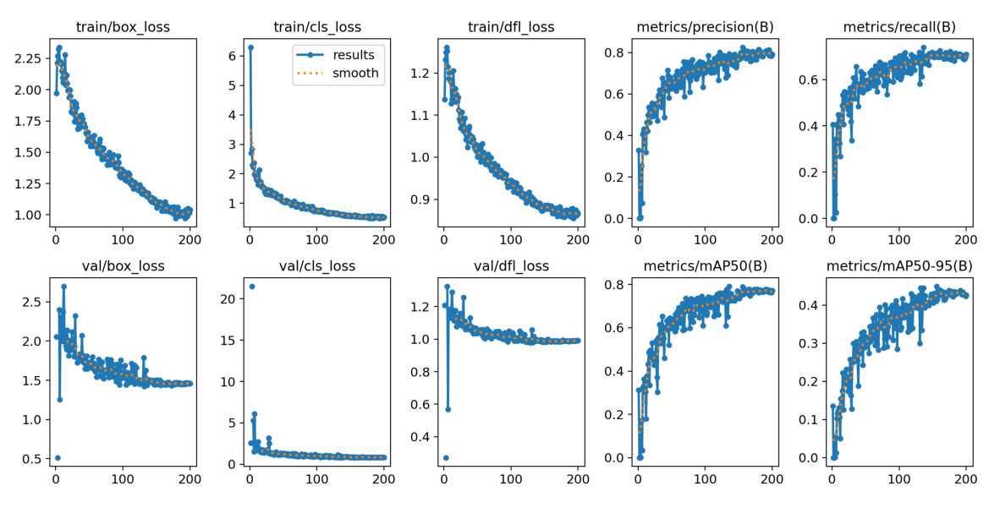

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
results_img_path = "runs/detect/train/results.png"

if os.path.exists(results_img_path):
    img = mpimg.imread(results_img_path)
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off') 
    plt.show()
else:
    print("Файл results.png не найден")


image 1/1 /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/images/test/train_BRK_2123_JPG.rf.b67602dd7054a47527b739791461a7bf.jpg: 960x1280 2 humans, 21.6ms
Speed: 8.0ms preprocess, 21.6ms inference, 1.8ms postprocess per image at shape (1, 3, 960, 1280)
Results saved to runs/detect/predict


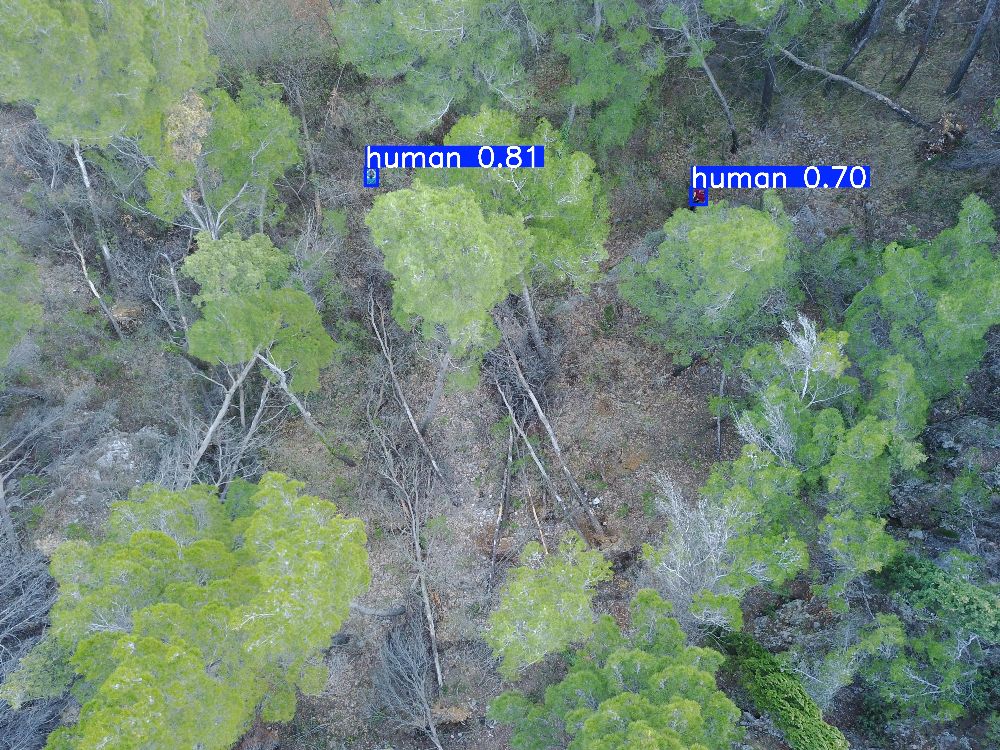


image 1/1 /home/v.chernodolya/introduction_to_ai/heridal/yolo_dataset/images/test/train_GOR_3002_JPG.rf.1f8cd89bb8cd6d07ea10dbacc08fe7e0.jpg: 960x1280 1 human, 21.6ms
Speed: 7.9ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 960, 1280)
Results saved to runs/detect/predict


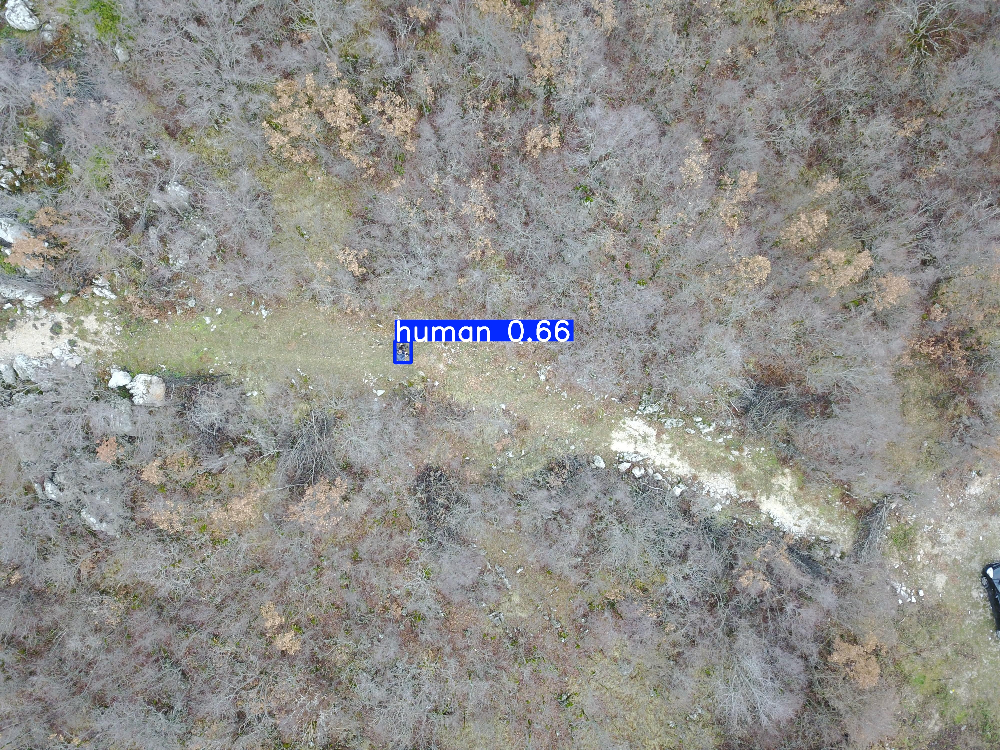

In [35]:
def show_detection_examples(n=2):
    test_images = [f for f in os.listdir("yolo_dataset/images/test") if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    
    if not test_images:
        print("В тестовой папке нет изображений")
        return
    
    selected_images = np.random.choice(test_images, min(n, len(test_images)), replace=False)
    
    for img_name in selected_images:
        img_path = os.path.join("yolo_dataset/images/test", img_name)
        results = model.predict(
            source=img_path,
            conf=0.5,
            save=True,
            project="runs/detect",
            name="predict",
            exist_ok=True
        )
        
        result_path = f"runs/detect/predict/{img_name}"
        if os.path.exists(result_path):
            display(Image(filename=result_path, width=800))
        else:
            print(f"Результат не найден: {result_path}")

show_detection_examples()